# Working with DSing Audio

In [2]:
import pandas as pd
import IPython
import torch
import torchaudio

from eda_helpers import print_stats, plot_waveform, plot_specgram, play_audio

print(f"Pytorch Version {torch.__version__}")
print(f"Pytorch Audio Version {torchaudio.__version__}")

Pytorch Version 2.2.1
Pytorch Audio Version 2.2.1


In [5]:
# read in a file from DSing
dataset_folder = "/Users/das/DATASCI266/damp.audio/"
example_song = "360_21740786.m4a"
filename = dataset_folder+example_song

## Parse Dataset Metadata

plyrid - Singer ID (or player ID)<br>
perf_key - Performance ID for Singer and Song.<br>
songid - Song ID<br>
gender - Gender of Singer<br>
birthyear - Birth Year of Singer<br>
lovetot - TBD<br>
zone - TBD<br>

In [3]:
dsing_metadata = pd.read_csv('../damp.audio/damp.perfs.csv')
dsing_metadata.head()

,plyrid,perf_key,songid,gender,birthyear,lovetot,zone
0,360,360_35435057,_hey_there_delilah,M,1988.0,3.0,EN
1,360,360_26934219,_closing_time,M,1988.0,2.0,EN
2,360,360_35435961,_burn,M,1988.0,2.0,EN
3,360,360_36313263,_burn,M,1988.0,2.0,EN
4,360,360_35352936,_as_long_as_you_love_me,M,1988.0,2.0,EN


In [11]:
dsing_metadata.shape

(34620, 7)

In [6]:
dsing_metadata[dsing_metadata['perf_key']==example_song[:-4]]

,plyrid,perf_key,songid,gender,birthyear,lovetot,zone
9,360,360_21740786,_all_the_small_things,M,1988.0,1.0,EN


In [8]:
dsing_metadata.zone.value_counts()

zone
EN    32990
ES      710
FR      520
DE      210
JA      110
ZH       60
KO       20
Name: count, dtype: int64

## Play Song from Dsing

Sample Rate: 22050
Shape: (1, 3554816)
Dtype: torch.float32
 - Max:      1.028
 - Min:     -1.038
 - Mean:     0.000
 - Std Dev:  0.154

tensor([[-0.0001, -0.0002, -0.0002,  ..., -0.0002, -0.0007, -0.0005]])



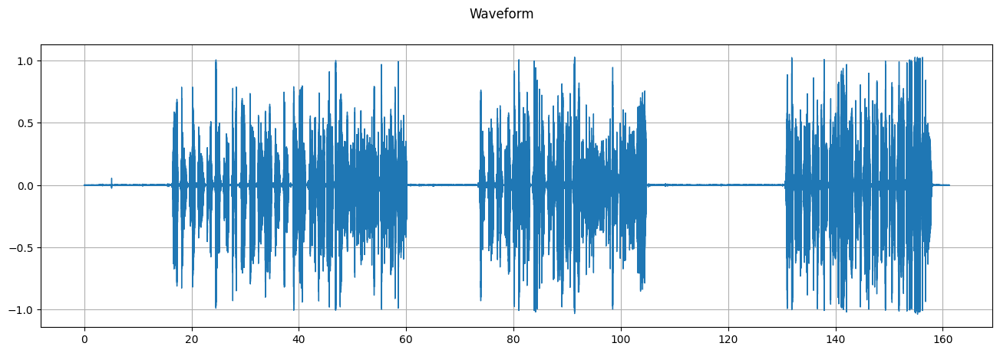

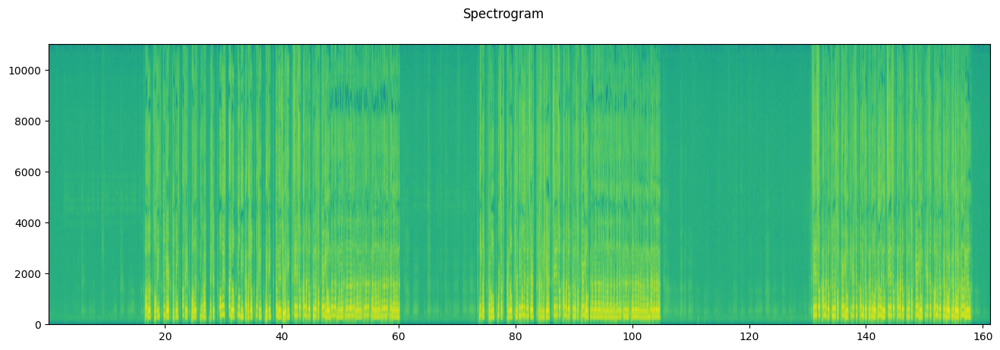

In [3]:
#read in samples from file...
metadata = torchaudio.info(filename)
print(metadata)

waveform, sample_rate = torchaudio.load(filename)

print_stats(waveform, sample_rate=sample_rate)
plot_waveform(waveform, sample_rate)
plot_specgram(waveform, sample_rate)
play_audio(waveform, sample_rate)